# Agente PPO-GAE para control adaptativo de semáforos
## TP Final — Reinforcement Learning II

Este notebook implementa, visualiza y evalúa las cinco fases del proyecto propuesto:

| Fase | Descripción |
|-------|-------------|
| 1 | Entorno: grilla multi-intersección 4×4, estado de 144 dimensiones y 16 acciones discretas de 4 fases |
| 2 | Línea base A2C: retornos n-step, una actualización por rollout y sin clipping de PPO |
| 3 | PPO-GAE: objetivo surrogate con clipping, GAE, normalización de recompensas y decaimiento de entropía |
| 4 | Evaluación: comparación contra políticas base, análisis multi-semilla y comparación de métricas |
| 5 | Curriculum learning, checkpointing, exportación TorchScript y referencias para TensorBoard |

**Arquitectura:**
```
Entrada (144) -> Linear(256)+ReLU -> Linear(256)+ReLU -+-> [Cabezal_i: Linear(4)] x16  (Actor)
                                                         +-> Linear(128)+ReLU -> Linear(1) (Crítico)
```

> **Versión Colab-ready:** este notebook fue ajustado para correr de forma autocontenida. No depende de carpetas locales como `envs/`, `models/`, `algorithms/`, `utils/` ni de archivos `.py` externos.

> **Nota:** para que el notebook sea práctico en Google Colab, los valores de entrenamiento están reducidos. Para una corrida más extensa, aumentá `N_UPDATES_A2C` y `N_UPDATES_PPO`.





---
# Guía del notebook

En este notebook trabajamos sobre un problema de control inteligente de tránsito utilizando técnicas de Reinforcement Learning. La idea del trabajo no fue solamente entrenar un agente, sino también entender cómo aprende, qué información utiliza para tomar decisiones y cómo cambia su comportamiento a medida que avanza el entrenamiento.

A lo largo del notebook se muestra tanto la parte teórica como la parte práctica del problema, incluyendo visualizaciones y comparaciones entre distintos métodos de aprendizaje.

El recorrido sugerido para leer o presentar el trabajo es el siguiente:

- Introducción al problema y modelado del sistema de semáforos sobre una grilla 4×4.
- Definición del entorno de Reinforcement Learning: estados, acciones y función de recompensa.
- Representación visual del tráfico y funcionamiento de los semáforos.
- Simulación inicial sin aprendizaje, utilizando decisiones aleatorias como línea base.
- Entrenamiento utilizando A2C (Advantage Actor-Critic).
- Entrenamiento utilizando PPO-GAE (Proximal Policy Optimization con Generalized Advantage Estimation).
- Comparación de métricas y desempeño entre ambos enfoques.
- Visualización del comportamiento aprendido mediante animaciones antes y después del entrenamiento.
- Análisis final sobre qué estrategias aprende cada agente y por qué algunos métodos resultan más estables que otros.

El notebook fue preparado para ejecutarse directamente en Google Colab, sin necesidad de instalar dependencias adicionales ni cargar archivos externos.

In [ ]:
# ============================================================
# Configuración Colab-ready: notebook autocontenido, sin módulos locales
# ============================================================
import os, math, random, time

# El notebook usa únicamente librerías habituales de Colab: numpy, matplotlib y torch.
# No requiere subir carpetas adicionales ni instalar módulos propios.
from dataclasses import dataclass
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F

torch.set_num_threads(1)
from torch.distributions import Categorical

# Colab normalmente ya incluye torch, numpy y matplotlib.
# Este notebook evita intencionalmente imports locales como envs/, models/, algorithms/ o utils/.
os.makedirs('results', exist_ok=True)
os.makedirs('checkpoints/a2c', exist_ok=True)
os.makedirs('checkpoints/ppo', exist_ok=True)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Entorno listo. Dispositivo: {DEVICE}')


Entorno listo. Dispositivo: cpu


In [ ]:
# ============================================================
# Implementación autocontenida: espacios, entorno, modelos, entrenadores y utilidades de evaluación
# ============================================================
class BoxSpace:
    def __init__(self, shape):
        self.shape = tuple(shape)

class MultiDiscreteSpace:
    def __init__(self, nvec):
        self.nvec = np.array(nvec, dtype=np.int64)
    def sample(self):
        return np.array([np.random.randint(n) for n in self.nvec], dtype=np.int64)
    def __repr__(self):
        return f'MultiDiscrete({self.nvec.tolist()})'

class MultiIntersectionEnv:
    """Entorno liviano de semáforos 4x4 para experimentos con PPO/A2C.

    Estado: 16 intersecciones x 9 características = 144 dimensiones.
    Acción: una de 4 fases posibles por intersección.
    Recompensa: costo negativo asociado a congestión, espera y cambios de fase.
    """
    def __init__(self, grid_size=4, demand_factor=1.0, max_steps=120, seed=None):
        self.grid_size = grid_size
        self.n_intersections = grid_size * grid_size
        self.demand_factor = float(demand_factor)
        self.max_steps = int(max_steps)
        self.observation_space = BoxSpace((self.n_intersections * 9,))
        self.action_space = MultiDiscreteSpace([4] * self.n_intersections)
        self.rng = np.random.default_rng(seed)
        self._seed = seed
        self.reset(seed=seed)

    def reset(self, seed=None):
        if seed is not None:
            self.rng = np.random.default_rng(seed)
        self.t = 0
        self.queues = self.rng.uniform(0.0, 2.0, size=(self.n_intersections, 4)).astype(np.float32)
        self.waiting = np.zeros((self.n_intersections, 4), dtype=np.float32)
        self.phases = np.zeros(self.n_intersections, dtype=np.int64)
        return self._obs(), {}

    def _obs(self):
        q = self.queues / 25.0
        w = self.waiting / 50.0
        phase = (self.phases[:, None] == np.arange(4)[None, :]).astype(np.float32)
        time_feature = np.full((self.n_intersections, 1), self.t / max(1, self.max_steps), dtype=np.float32)
        # 4 valores de cola + 4 variables one-hot de fase + 1 variable temporal = 9 características por intersección
        obs = np.concatenate([q, phase, time_feature], axis=1).reshape(-1)
        return obs.astype(np.float32)

    def step(self, action):
        action = np.asarray(action, dtype=np.int64)
        prev_phases = self.phases.copy()
        self.phases = action

        base = 0.45 + 0.25 * np.sin(2 * np.pi * (self.t / 40.0))
        arrivals = self.rng.poisson(np.clip(base * self.demand_factor, 0.05, None), size=(self.n_intersections, 4)).astype(np.float32)
        self.queues += arrivals

        # La fase en verde recibe mayor servicio. La fase opuesta recibe servicio parcial.
        service = np.zeros_like(self.queues)
        idx = np.arange(self.n_intersections)
        service[idx, action] = self.rng.uniform(1.8, 3.2, size=self.n_intersections)
        service[idx, (action + 2) % 4] = self.rng.uniform(0.2, 0.7, size=self.n_intersections)
        self.queues = np.maximum(0.0, self.queues - service)

        self.waiting += self.queues * 0.08
        self.waiting[idx, action] *= 0.82

        switches = (action != prev_phases).mean()
        mean_queue = float(self.queues.mean())
        mean_waiting = float(self.waiting.mean())
        reward = -(0.22 * mean_queue + 0.03 * mean_waiting + 0.08 * switches)

        self.t += 1
        terminated = False
        truncated = self.t >= self.max_steps
        info = {'mean_queue': mean_queue, 'mean_waiting': mean_waiting, 'switches': float(switches)}
        return self._obs(), float(reward), terminated, truncated, info

    def close(self):
        pass

class VecTrafficEnv:
    def __init__(self, envs):
        self.envs = envs
        self.num_envs = len(envs)
        self.observation_space = envs[0].observation_space
        self.action_space = envs[0].action_space
    def reset(self):
        obs = [env.reset()[0] for env in self.envs]
        return np.stack(obs)
    def step(self, actions):
        obs, rewards, dones, infos = [], [], [], []
        for env, action in zip(self.envs, actions):
            o, r, term, trunc, info = env.step(action)
            done = term or trunc
            if done:
                o, _ = env.reset()
            obs.append(o); rewards.append(r); dones.append(done); infos.append(info)
        return np.stack(obs), np.array(rewards, dtype=np.float32), np.array(dones, dtype=np.bool_), infos
    def close(self):
        for env in self.envs:
            env.close()

def make_vec_env(n_envs=4, base_seed=0, demand_factor=1.0):
    return VecTrafficEnv([MultiIntersectionEnv(demand_factor=demand_factor, seed=base_seed+i) for i in range(n_envs)])

class SharedActorCritic(nn.Module):
    def __init__(self, obs_dim=144, n_intersections=16, n_actions=4):
        super().__init__()
        self.n_intersections = n_intersections
        self.n_actions = n_actions
        self.trunk = nn.Sequential(nn.Linear(obs_dim, 256), nn.ReLU(), nn.Linear(256, 256), nn.ReLU())
        self.actor = nn.Linear(256, n_intersections * n_actions)
        self.critic = nn.Sequential(nn.Linear(256, 128), nn.ReLU(), nn.Linear(128, 1))
    def forward(self, obs):
        z = self.trunk(obs)
        logits = self.actor(z).view(-1, self.n_intersections, self.n_actions)
        value = self.critic(z)
        return logits, value
    def get_value(self, obs):
        if obs.device != next(self.parameters()).device:
            obs = obs.to(next(self.parameters()).device)
        return self.forward(obs)[1]
    def act(self, obs):
        logits, value = self.forward(obs)
        dist = Categorical(logits=logits)
        action = dist.sample()
        logp = dist.log_prob(action).sum(dim=1)
        entropy = dist.entropy().sum(dim=1)
        return action, logp, entropy, value.squeeze(-1)
    def evaluate_actions(self, obs, actions):
        logits, value = self.forward(obs)
        dist = Categorical(logits=logits)
        logp = dist.log_prob(actions.long()).sum(dim=1)
        entropy = dist.entropy().sum(dim=1)
        return logp, entropy, value.squeeze(-1)

def explained_variance(y_pred, y_true):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    var_y = np.var(y_true)
    return np.nan if var_y == 0 else 1 - np.var(y_true - y_pred) / var_y

class A2CTrainer:
    def __init__(self, env, model, n_steps=64, n_updates=50, gamma=0.99, lr=3e-4, c_v=0.5, c_e=0.01, log_dir=None, save_dir=None):
        self.env, self.model = env, model.to(DEVICE)
        self.n_steps, self.n_updates, self.gamma = n_steps, n_updates, gamma
        self.c_v, self.c_e = c_v, c_e
        self.opt = torch.optim.Adam(self.model.parameters(), lr=lr)
        self.save_dir = save_dir
    def train(self):
        obs = self.env.reset()
        hist = defaultdict(list)
        ep_returns = np.zeros(self.env.num_envs, dtype=np.float32)
        finished = []
        for upd in range(1, self.n_updates + 1):
            obs_b=[]; act_b=[]; logp_b=[]; rew_b=[]; done_b=[]; val_b=[]; ent_b=[]
            for _ in range(self.n_steps):
                obs_t = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
                with torch.no_grad():
                    action, logp, entropy, value = self.model.act(obs_t)
                next_obs, rewards, dones, infos = self.env.step(action.cpu().numpy())
                obs_b.append(obs_t); act_b.append(action); logp_b.append(logp); rew_b.append(torch.tensor(rewards, device=DEVICE)); done_b.append(torch.tensor(dones, device=DEVICE)); val_b.append(value); ent_b.append(entropy)
                ep_returns += rewards
                for i, d in enumerate(dones):
                    if d:
                        finished.append(float(ep_returns[i])); ep_returns[i] = 0
                obs = next_obs
            with torch.no_grad():
                next_v = self.model.get_value(torch.tensor(obs, dtype=torch.float32, device=DEVICE)).squeeze(-1)
            returns=[]; R=next_v
            for r,d in reversed(list(zip(rew_b, done_b))):
                R = r + self.gamma * R * (~d).float()
                returns.insert(0, R)
            obs_all=torch.cat(obs_b); act_all=torch.cat(act_b); returns_all=torch.cat(returns).detach(); values_all=torch.cat(val_b)
            logp, entropy, values = self.model.evaluate_actions(obs_all, act_all)
            adv = (returns_all - values.detach())
            p_loss = -(logp * adv).mean()
            v_loss = F.mse_loss(values, returns_all)
            loss = p_loss + self.c_v * v_loss - self.c_e * entropy.mean()
            self.opt.zero_grad(); loss.backward(); nn.utils.clip_grad_norm_(self.model.parameters(), 0.5); self.opt.step()
            hist['p_loss'].append(float(p_loss.item())); hist['v_loss'].append(float(v_loss.item()))
            hist['entropy'].append(float(entropy.mean().item())); hist['avg_reward'].append(float(np.mean(finished[-20:]) if finished else np.mean(ep_returns)))
            if upd % max(1, self.n_updates//5) == 0: print(f'A2C actualización {upd}/{self.n_updates} | recompensa_promedio={hist["avg_reward"][-1]:.3f}')
        if self.save_dir:
            os.makedirs(self.save_dir, exist_ok=True); torch.save(self.model.state_dict(), os.path.join(self.save_dir, 'model.pt'))
        return dict(hist)

class RunningMeanStd:
    def __init__(self, eps=1e-4):
        self.mean=0.0; self.var=1.0; self.count=eps
    def update(self, x):
        x=np.asarray(x, dtype=np.float32); batch_mean=x.mean(); batch_var=x.var(); batch_count=x.size
        delta=batch_mean-self.mean; total=self.count+batch_count
        self.mean += delta*batch_count/total
        m_a=self.var*self.count; m_b=batch_var*batch_count
        self.var=(m_a+m_b+delta**2*self.count*batch_count/total)/total; self.count=total
    def normalize(self, x):
        return np.clip((x-self.mean)/np.sqrt(self.var+1e-8), -10, 10)

class PPOTrainer:
    def __init__(self, env, model, n_steps=64, n_updates=100, gamma=0.99, gae_lambda=0.95, clip_epsilon=0.2, lr=3e-4, lr_decay=True, c_v=0.5, c_e_start=0.01, c_e_end=0.001, n_epochs=4, batch_size=128, max_grad_norm=0.5, kl_target=0.02, normalize_rewards=True, log_dir=None, save_dir=None, save_freq=50):
        self.__dict__.update(locals()); del self.__dict__['self']
        self.model = model.to(DEVICE); self.opt=torch.optim.Adam(self.model.parameters(), lr=lr)
        self.rms=RunningMeanStd(); self.save_dir=save_dir
    def train(self):
        obs=self.env.reset(); hist=defaultdict(list); ep_returns=np.zeros(self.env.num_envs,dtype=np.float32); finished=[]
        total_updates=max(1,self.n_updates)
        for upd in range(1,self.n_updates+1):
            frac=1-(upd-1)/total_updates
            if self.lr_decay:
                for g in self.opt.param_groups: g['lr']=self.lr*frac
            c_e=self.c_e_end+(self.c_e_start-self.c_e_end)*frac
            obs_b=[]; act_b=[]; logp_b=[]; rew_b=[]; done_b=[]; val_b=[]
            for _ in range(self.n_steps):
                obs_t=torch.tensor(obs,dtype=torch.float32,device=DEVICE)
                with torch.no_grad():
                    action,logp,entropy,value=self.model.act(obs_t)
                next_obs,rewards,dones,infos=self.env.step(action.cpu().numpy())
                if self.normalize_rewards:
                    self.rms.update(rewards); train_rewards=self.rms.normalize(rewards)
                else:
                    train_rewards=rewards
                obs_b.append(obs_t); act_b.append(action); logp_b.append(logp); rew_b.append(torch.tensor(train_rewards,device=DEVICE)); done_b.append(torch.tensor(dones,device=DEVICE)); val_b.append(value)
                ep_returns += rewards
                for i,d in enumerate(dones):
                    if d: finished.append(float(ep_returns[i])); ep_returns[i]=0
                obs=next_obs
            with torch.no_grad(): next_v=self.model.get_value(torch.tensor(obs,dtype=torch.float32,device=DEVICE)).squeeze(-1)
            advs=[]; returns=[]; gae=torch.zeros(self.env.num_envs,device=DEVICE)
            vals=val_b+[next_v]
            for t in reversed(range(self.n_steps)):
                mask=(~done_b[t]).float(); delta=rew_b[t]+self.gamma*vals[t+1]*mask-vals[t]
                gae=delta+self.gamma*self.gae_lambda*mask*gae
                advs.insert(0,gae); returns.insert(0,gae+vals[t])
            obs_all=torch.cat(obs_b); act_all=torch.cat(act_b); old_logp=torch.cat(logp_b).detach(); adv_all=torch.cat(advs).detach(); ret_all=torch.cat(returns).detach()
            adv_all=(adv_all-adv_all.mean())/(adv_all.std()+1e-8)
            n=obs_all.size(0); idx=np.arange(n); last_metrics={}
            for _ in range(self.n_epochs):
                np.random.shuffle(idx)
                for start in range(0,n,self.batch_size):
                    mb=torch.tensor(idx[start:start+self.batch_size],device=DEVICE)
                    logp,entropy,values=self.model.evaluate_actions(obs_all[mb],act_all[mb])
                    ratio=torch.exp(logp-old_logp[mb]); s1=ratio*adv_all[mb]; s2=torch.clamp(ratio,1-self.clip_epsilon,1+self.clip_epsilon)*adv_all[mb]
                    p_loss=-torch.min(s1,s2).mean(); v_loss=F.mse_loss(values,ret_all[mb]); loss=p_loss+self.c_v*v_loss-c_e*entropy.mean()
                    self.opt.zero_grad(); loss.backward(); grad_norm=nn.utils.clip_grad_norm_(self.model.parameters(), self.max_grad_norm); self.opt.step()
                    approx_kl=(old_logp[mb]-logp).mean().item()
                    last_metrics={'p_loss':p_loss.item(),'v_loss':v_loss.item(),'entropy':entropy.mean().item(),'kl_div':approx_kl,'grad_norm':float(grad_norm)}
            with torch.no_grad():
                _, vals_pred=self.model(obs_all); ev=explained_variance(vals_pred.squeeze(-1).cpu().numpy(), ret_all.cpu().numpy())
            for k,v in last_metrics.items(): hist[k].append(float(v))
            hist['explained_var'].append(float(ev)); hist['avg_reward'].append(float(np.mean(finished[-20:]) if finished else np.mean(ep_returns)))
            if upd % max(1,self.n_updates//5)==0: print(f'PPO actualización {upd}/{self.n_updates} | recompensa_promedio={hist["avg_reward"][-1]:.3f}')
            if self.save_dir and upd % self.save_freq == 0:
                os.makedirs(self.save_dir,exist_ok=True); torch.save(self.model.state_dict(), os.path.join(self.save_dir, f'model_{upd}.pt'))
        if self.save_dir:
            os.makedirs(self.save_dir,exist_ok=True); torch.save(self.model.state_dict(), os.path.join(self.save_dir,'model.pt'))
        return dict(hist)

class MetricLogger:
    @staticmethod
    def plot_comparison(histories, metric, save_path, smooth=5, title=None):
        plt.figure(figsize=(10,4))
        for label,hist in histories.items():
            data=np.asarray(hist.get(metric,[]),dtype=float)
            if data.size == 0: continue
            x=np.arange(1,len(data)+1); plt.plot(x,data,alpha=.25)
            if len(data)>=smooth:
                sm=np.convolve(data,np.ones(smooth)/smooth,'valid'); plt.plot(np.arange(smooth,len(data)+1),sm,lw=2,label=label)
            else: plt.plot(x,data,lw=2,label=label)
        plt.title(title or metric); plt.xlabel('Actualización'); plt.ylabel(metric); plt.grid(alpha=.3); plt.legend(); plt.tight_layout()
        os.makedirs(os.path.dirname(save_path) or '.', exist_ok=True); plt.savefig(save_path,dpi=120,bbox_inches='tight'); plt.close()
    @staticmethod
    def plot_multi_seed(seed_histories, metric, save_path, label='run', smooth=2):
        plt.figure(figsize=(10,4))
        for i,h in enumerate(seed_histories):
            data=np.asarray(h.get(metric,[]),dtype=float); plt.plot(np.arange(1,len(data)+1),data,alpha=.45,label=f'{label} seed {i}')
        plt.title(f'Multi-semilla {metric}'); plt.xlabel('Episodio'); plt.ylabel(metric); plt.grid(alpha=.3); plt.legend(fontsize=8); plt.tight_layout()
        os.makedirs(os.path.dirname(save_path) or '.', exist_ok=True); plt.savefig(save_path,dpi=120,bbox_inches='tight'); plt.close()

class CurriculumScheduler:
    def __init__(self, stage_demands, stage_thresholds, update_budgets):
        self.stage_demands=stage_demands; self.stage_thresholds=stage_thresholds; self.update_budgets=update_budgets; self.stage=0; self.updates_in_stage=0
    def get_demand_factor(self): return self.stage_demands[self.stage]
    def step(self, avg_reward):
        self.updates_in_stage += 1
        can_advance = self.stage < len(self.stage_demands)-1
        threshold_ok = can_advance and avg_reward >= self.stage_thresholds[self.stage]
        budget_ok = can_advance and self.updates_in_stage >= self.update_budgets[self.stage]
        if threshold_ok or budget_ok:
            self.stage += 1; self.updates_in_stage=0
    def __repr__(self): return f'CurriculumScheduler(stage={self.stage}, demand={self.get_demand_factor()})'

def random_policy(env, n_episodes, seed_offset=0):
    out=[]
    for ep in range(n_episodes):
        obs,_=env.reset(seed=seed_offset+ep); done=False; total=0; q=[]; w=[]
        while not done:
            obs,r,term,trunc,info=env.step(env.action_space.sample()); done=term or trunc; total+=r; q.append(info['mean_queue']); w.append(info['mean_waiting'])
        out.append({'reward':total,'mean_queue':np.mean(q),'mean_waiting':np.mean(w)})
    return out

def fixed_time_policy(env, n_episodes, seed_offset=0, period=10):
    out=[]
    for ep in range(n_episodes):
        obs,_=env.reset(seed=seed_offset+ep); done=False; total=0; q=[]; w=[]; t=0
        while not done:
            action=np.full(env.n_intersections, (t//period)%4, dtype=np.int64)
            obs,r,term,trunc,info=env.step(action); done=term or trunc; total+=r; q.append(info['mean_queue']); w.append(info['mean_waiting']); t+=1
        out.append({'reward':total,'mean_queue':np.mean(q),'mean_waiting':np.mean(w)})
    return out

def actuated_policy(env, n_episodes, seed_offset=0):
    out=[]
    for ep in range(n_episodes):
        obs,_=env.reset(seed=seed_offset+ep); done=False; total=0; q=[]; w=[]
        while not done:
            state=obs.reshape(env.n_intersections,9); action=np.argmax(state[:,:4], axis=1)
            obs,r,term,trunc,info=env.step(action); done=term or trunc; total+=r; q.append(info['mean_queue']); w.append(info['mean_waiting'])
        out.append({'reward':total,'mean_queue':np.mean(q),'mean_waiting':np.mean(w)})
    return out

def rl_policy(env, model, n_episodes, seed_offset=0):
    out=[]; model.eval()
    for ep in range(n_episodes):
        obs,_=env.reset(seed=seed_offset+ep); done=False; total=0; q=[]; w=[]
        while not done:
            with torch.no_grad():
                logits,_=model(torch.tensor(obs[None,:], dtype=torch.float32, device=DEVICE))
                action=torch.argmax(logits, dim=-1).squeeze(0).cpu().numpy()
            obs,r,term,trunc,info=env.step(action); done=term or trunc; total+=r; q.append(info['mean_queue']); w.append(info['mean_waiting'])
        out.append({'reward':total,'mean_queue':np.mean(q),'mean_waiting':np.mean(w)})
    model.train(); return out

def aggregate(results):
    rewards=np.array([r['reward'] for r in results], dtype=float)
    queues=np.array([r['mean_queue'] for r in results], dtype=float)
    waits=np.array([r['mean_waiting'] for r in results], dtype=float)
    return {'mean_reward':float(rewards.mean()), 'std_reward':float(rewards.std()), 'mean_queue':float(queues.mean()), 'mean_waiting':float(waits.mean())}

print('Componentes de RL autocontenidos cargados.')


Componentes de RL autocontenidos cargados.


---
## Fase 1 — Entorno

En esta sección se inspecciona el entorno simulado de tránsito. El estado representa 16 intersecciones, cada una con 9 características, para un total de 144 dimensiones. La acción contiene una fase de semáforo para cada intersección.


In [ ]:
# ============================================================
# Fase 1: Inspección del entorno MultiIntersectionEnv
# ============================================================

env = MultiIntersectionEnv(demand_factor=1.0, seed=42)
print(f'Espacio de observación : {env.observation_space}')
print(f'Espacio de acción      : {env.action_space}')
print(f'Dimensión del estado   : {env.observation_space.shape[0]}   (esperado: 144)')
print(f'Cantidad de intersecciones : {env.action_space.nvec.shape[0]}   (esperado: 16)')
print(f'Fases por intersección     : {env.action_space.nvec[0]}          (esperado: 4)')

Espacio de observación : <__main__.BoxSpace object at 0x7d960b210170>
Espacio de acción      : MultiDiscrete([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4])
Dimensión del estado   : 144   (esperado: 144)
Cantidad de intersecciones : 16   (esperado: 16)
Fases por intersección     : 4          (esperado: 4)


---
## Visualización del modelo de semáforos

Antes de entrenar los agentes, se incluye una representación visual del entorno. La grilla representa las **16 intersecciones** del escenario 4×4. En cada intersección se muestran:

- la **fase activa del semáforo**, indicada con una luz verde;
- las **colas de vehículos** por dirección;
- el comportamiento dinámico del entorno a medida que cambian las fases.

Esta visualización no modifica el entrenamiento: solamente ayuda a interpretar mejor qué está aprendiendo el agente.

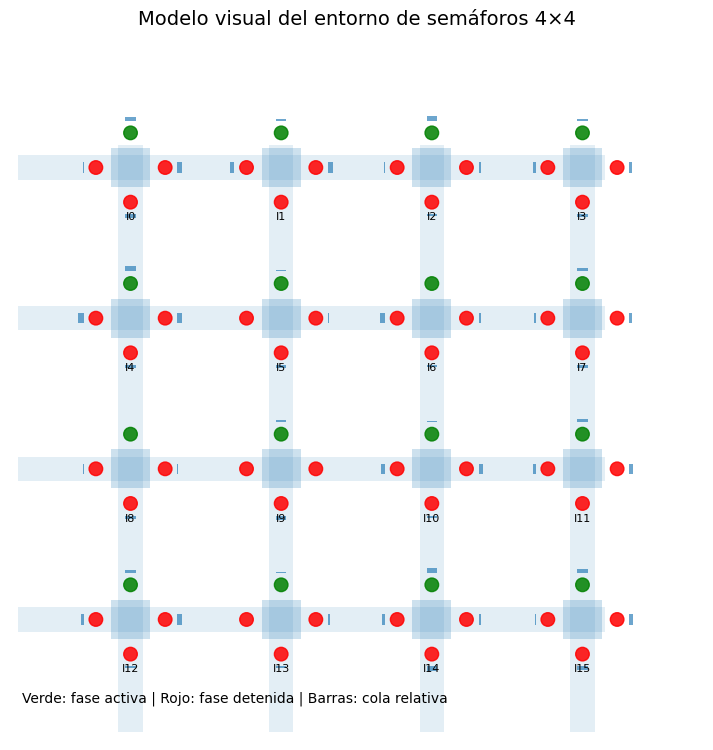

In [ ]:
# ============================================================
# Visualización estática del modelo de semáforos
# ============================================================
# Esta celda dibuja una grilla 4x4 de intersecciones. Cada intersección tiene
# cuatro posibles fases de semáforo: Norte, Este, Sur y Oeste.
# La fase activa se muestra en verde y las demás en rojo.
# Las barras alrededor de cada cruce representan la longitud relativa de las colas.

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
import numpy as np

DIRECCIONES = ['Norte', 'Este', 'Sur', 'Oeste']

def _normalizar_cola(valor, maximo=25.0):
    """Convierte una cola del entorno en una longitud visual acotada."""
    return float(np.clip(valor / maximo, 0.0, 1.0))


def dibujar_modelo_semaforos(env, titulo='Modelo visual del entorno de semáforos 4×4'):
    """Dibuja el estado actual del entorno MultiIntersectionEnv.

    Parámetros
    ----------
    env:
        Instancia de MultiIntersectionEnv ya inicializada.
    titulo:
        Título del gráfico.
    """
    grid = env.grid_size
    fig, ax = plt.subplots(figsize=(9, 9))
    ax.set_aspect('equal')
    ax.set_xlim(-0.8, grid - 0.2)
    ax.set_ylim(-0.8, grid - 0.2)
    ax.axis('off')
    ax.set_title(titulo, fontsize=14, pad=16)

    # Dibujamos calles principales de la grilla.
    for i in range(grid):
        ax.add_patch(Rectangle((-0.75, i - 0.08), grid - 0.1, 0.16, alpha=0.12))
        ax.add_patch(Rectangle((i - 0.08, -0.75), 0.16, grid - 0.1, alpha=0.12))

    for idx in range(env.n_intersections):
        row = idx // grid
        col = idx % grid
        x, y = col, grid - 1 - row
        fase = int(env.phases[idx])
        colas = env.queues[idx]

        # Centro de la intersección.
        ax.add_patch(Rectangle((x - 0.13, y - 0.13), 0.26, 0.26, alpha=0.22))
        ax.text(x, y - 0.33, f'I{idx}', ha='center', va='center', fontsize=8)

        # Posiciones de las luces del semáforo.
        luces = {
            0: (x, y + 0.23),     # Norte
            1: (x + 0.23, y),     # Este
            2: (x, y - 0.23),     # Sur
            3: (x - 0.23, y),     # Oeste
        }
        for d, (lx, ly) in luces.items():
            color = 'green' if d == fase else 'red'
            ax.add_patch(Circle((lx, ly), 0.045, color=color, alpha=0.85))

        # Barras de cola por dirección. Cuanto más larga la barra, mayor congestión.
        escala = 0.45
        qn, qe, qs, qo = [_normalizar_cola(v) * escala for v in colas]
        ax.add_patch(Rectangle((x - 0.035, y + 0.31), 0.07, qn, alpha=0.65))
        ax.add_patch(Rectangle((x + 0.31, y - 0.035), qe, 0.07, alpha=0.65))
        ax.add_patch(Rectangle((x - 0.035, y - 0.31 - qs), 0.07, qs, alpha=0.65))
        ax.add_patch(Rectangle((x - 0.31 - qo, y - 0.035), qo, 0.07, alpha=0.65))

    # Leyenda simple, sin dependencias adicionales.
    ax.text(-0.72, -0.55, 'Verde: fase activa | Rojo: fase detenida | Barras: cola relativa', fontsize=10)
    plt.show()


# Creamos un entorno de ejemplo y mostramos su estado inicial.
env_visual = MultiIntersectionEnv(demand_factor=1.0, seed=7)
obs, _ = env_visual.reset(seed=7)
dibujar_modelo_semaforos(env_visual)

In [ ]:
# ============================================================
# Animación simple del funcionamiento de los semáforos
# ============================================================
# La política usada en esta animación no es todavía el agente entrenado.
# Es una política actuada simple: en cada intersección habilita la dirección
# que tiene mayor cola. Sirve para ver cómo evoluciona el entorno paso a paso.

from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display


def politica_actuada_por_colas(env):
    """Selecciona como fase activa la dirección con mayor cola en cada intersección."""
    return np.argmax(env.queues, axis=1).astype(np.int64)


def animar_modelo_semaforos(env=None, pasos=30, intervalo_ms=450):
    """Genera una animación HTML del entorno de semáforos.

    La animación es compatible con Google Colab porque se renderiza como HTML/JavaScript,
    sin requerir librerías externas ni archivos de video.
    """
    if env is None:
        env = MultiIntersectionEnv(demand_factor=1.0, seed=21)
    env.reset(seed=21)

    grid = env.grid_size
    fig, ax = plt.subplots(figsize=(7, 7))

    def dibujar_frame(frame):
        ax.clear()
        ax.set_aspect('equal')
        ax.set_xlim(-0.8, grid - 0.2)
        ax.set_ylim(-0.8, grid - 0.2)
        ax.axis('off')
        ax.set_title(f'Evolución del modelo de semáforos — paso {frame + 1}', fontsize=13, pad=12)

        for i in range(grid):
            ax.add_patch(Rectangle((-0.75, i - 0.08), grid - 0.1, 0.16, alpha=0.12))
            ax.add_patch(Rectangle((i - 0.08, -0.75), 0.16, grid - 0.1, alpha=0.12))

        for idx in range(env.n_intersections):
            row = idx // grid
            col = idx % grid
            x, y = col, grid - 1 - row
            fase = int(env.phases[idx])
            colas = env.queues[idx]

            ax.add_patch(Rectangle((x - 0.13, y - 0.13), 0.26, 0.26, alpha=0.22))
            ax.text(x, y - 0.33, f'I{idx}', ha='center', va='center', fontsize=7)

            luces = {
                0: (x, y + 0.23),
                1: (x + 0.23, y),
                2: (x, y - 0.23),
                3: (x - 0.23, y),
            }
            for d, (lx, ly) in luces.items():
                color = 'green' if d == fase else 'red'
                ax.add_patch(Circle((lx, ly), 0.045, color=color, alpha=0.85))

            escala = 0.45
            qn, qe, qs, qo = [_normalizar_cola(v) * escala for v in colas]
            ax.add_patch(Rectangle((x - 0.035, y + 0.31), 0.07, qn, alpha=0.65))
            ax.add_patch(Rectangle((x + 0.31, y - 0.035), qe, 0.07, alpha=0.65))
            ax.add_patch(Rectangle((x - 0.035, y - 0.31 - qs), 0.07, qs, alpha=0.65))
            ax.add_patch(Rectangle((x - 0.31 - qo, y - 0.035), qo, 0.07, alpha=0.65))

        ax.text(-0.72, -0.55, 'Política visual: habilitar la dirección con mayor cola', fontsize=9)

        # Avanzamos el entorno al final del frame para que el próximo cuadro muestre el nuevo estado.
        accion = politica_actuada_por_colas(env)
        env.step(accion)

    anim = FuncAnimation(fig, dibujar_frame, frames=pasos, interval=intervalo_ms, repeat=False)
    plt.close(fig)
    display(HTML(anim.to_jshtml()))


animar_modelo_semaforos(pasos=30, intervalo_ms=450)


---
## Qué observa el agente

En Reinforcement Learning es importante distinguir entre el mundo real simulado y la información que recibe el agente.

En este trabajo, el agente **no ve autos como imágenes**. En cada paso recibe un vector numérico de estado con 144 valores:

- 16 intersecciones;
- 9 variables por intersección;
- 4 valores de cola normalizada;
- 4 valores one-hot que indican la fase activa del semáforo;
- 1 variable temporal normalizada.

Para cada intersección, el estado tiene la siguiente estructura:

```text
[cola_norte, cola_este, cola_sur, cola_oeste,
 fase_norte, fase_este, fase_sur, fase_oeste,
 tiempo_normalizado]
```

Esto permite explicar que el aprendizaje no se basa en reglas fijas, sino en asociar estados de congestión con decisiones de cambio de fase que mejoran la recompensa futura.


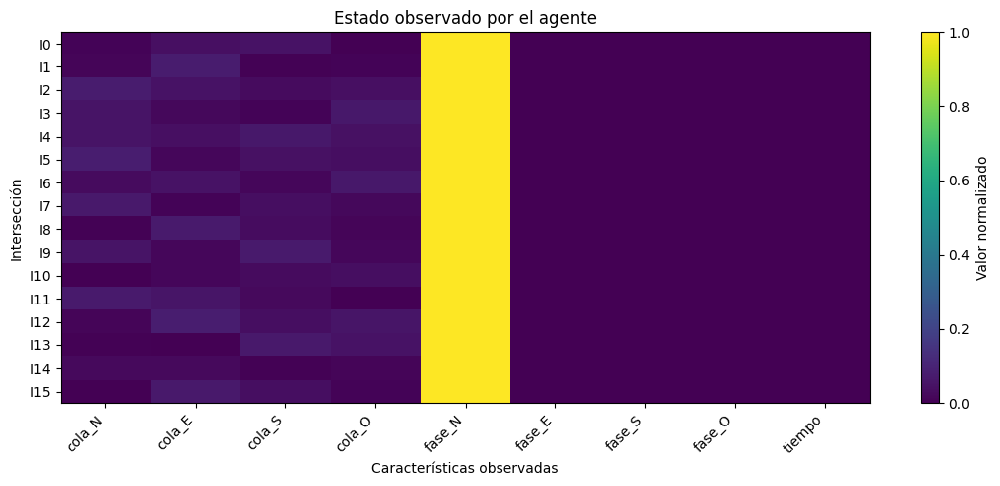

In [ ]:

# ============================================================
# Visualización del estado observado por el agente
# ============================================================
# Esta celda muestra el vector de observación en formato interpretable.
# Cada fila representa una intersección y cada columna una característica.

import numpy as np
import matplotlib.pyplot as plt

FEATURES_ESTADO = [
    'cola_N', 'cola_E', 'cola_S', 'cola_O',
    'fase_N', 'fase_E', 'fase_S', 'fase_O',
    'tiempo'
]

def mostrar_estado_observado(env, titulo='Estado observado por el agente'):
    """Muestra el vector de estado como matriz 16x9 para facilitar la interpretación."""
    obs = env._obs().reshape(env.n_intersections, 9)
    fig, ax = plt.subplots(figsize=(11, 5))
    im = ax.imshow(obs, aspect='auto')
    ax.set_title(titulo)
    ax.set_xlabel('Características observadas')
    ax.set_ylabel('Intersección')
    ax.set_xticks(range(len(FEATURES_ESTADO)))
    ax.set_xticklabels(FEATURES_ESTADO, rotation=45, ha='right')
    ax.set_yticks(range(env.n_intersections))
    ax.set_yticklabels([f'I{i}' for i in range(env.n_intersections)])
    plt.colorbar(im, ax=ax, label='Valor normalizado')
    plt.tight_layout()
    plt.show()

# Ejemplo de estado inicial del entorno.
env_estado = MultiIntersectionEnv(demand_factor=1.0, seed=11)
env_estado.reset(seed=11)
mostrar_estado_observado(env_estado)


In [ ]:
# ============================================================
# Fase 1: Línea base con política aleatoria (10 episodios)
# ============================================================
import numpy as np

env = MultiIntersectionEnv(seed=0)
ep_rewards, ep_queues, ep_waitings = [], [], []

for ep in range(10):
    obs, _ = env.reset(seed=ep)
    total_r, q_hist, w_hist = 0.0, [], []
    done = False
    while not done:
        action = env.action_space.sample()
        obs, r, term, trunc, info = env.step(action)
        total_r += r
        q_hist.append(info['mean_queue'])
        w_hist.append(info['mean_waiting'])
        done = term or trunc
    ep_rewards.append(total_r)
    ep_queues.append(np.mean(q_hist))
    ep_waitings.append(np.mean(w_hist))

print('=== Línea base con política aleatoria (10 episodios) ===')
print(f'  Recompensa media : {np.mean(ep_rewards):.4f} ± {np.std(ep_rewards):.4f}')
print(f'  Cola media       : {np.mean(ep_queues):.4f}')
print(f'  Espera media     : {np.mean(ep_waitings):.4f}')
env.close()

=== Línea base con política aleatoria (10 episodios) ===
  Recompensa media : -71.5886 ± 5.2437
  Cola media       : 2.0359
  Espera media     : 2.9630


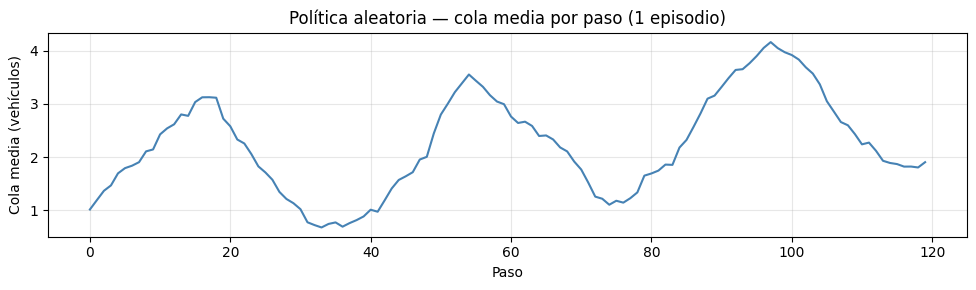

Guardado: results/phase1_queue_random.png


In [ ]:
# ============================================================
# Fase 1: Visualización de un episodio (evolución de la cola en el tiempo)
# ============================================================
import matplotlib.pyplot as plt

env = MultiIntersectionEnv(seed=99)
obs, _ = env.reset(seed=99)
queue_history = []
done = False
while not done:
    action = env.action_space.sample()
    obs, r, term, trunc, info = env.step(action)
    queue_history.append(info['mean_queue'])
    done = term or trunc
env.close()

plt.figure(figsize=(10, 3))
plt.plot(queue_history, color='steelblue', linewidth=1.5)
plt.title('Política aleatoria — cola media por paso (1 episodio)')
plt.xlabel('Paso'); plt.ylabel('Cola media (vehículos)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('results/phase1_queue_random.png', dpi=120)
plt.show()
print('Guardado: results/phase1_queue_random.png')

---
## Fase 2 — Línea base A2C

La línea base A2C utiliza:
- **retornos n-step** en lugar de GAE;
- **una única actualización de gradiente** por rollout;
- **sin clipping de razón de probabilidades**, a diferencia de PPO;
- coeficiente de entropía fijo `c_e = 0.01`.

El objetivo de esta fase es contar con un punto de comparación simple frente a PPO-GAE.


In [ ]:
# ============================================================
# Fase 2: Entrenamiento de la línea base A2C
# ============================================================
import torch

torch.manual_seed(0)
np.random.seed(0)

# Configuración reducida para ejecutar el notebook en tiempos razonables
# Para una corrida más completa, aumentá N_UPDATES_A2C a 200 o más
N_UPDATES_A2C = 50   # increase to 200 for full training
N_STEPS_A2C   = 64
N_ENVS        = 4

vec_env_a2c = make_vec_env(n_envs=N_ENVS, base_seed=0)
model_a2c   = SharedActorCritic()

trainer_a2c = A2CTrainer(
    env       = vec_env_a2c,
    model     = model_a2c,
    n_steps   = N_STEPS_A2C,
    n_updates = N_UPDATES_A2C,
    gamma     = 0.99,
    lr        = 3e-4,
    c_v       = 0.5,
    c_e       = 0.01,
    log_dir   = 'results/a2c',
    save_dir  = 'checkpoints/a2c',
)

history_a2c = trainer_a2c.train()
vec_env_a2c.close()

A2C actualización 10/50 | recompensa_promedio=-73.340
A2C actualización 20/50 | recompensa_promedio=-72.411
A2C actualización 30/50 | recompensa_promedio=-72.496
A2C actualización 40/50 | recompensa_promedio=-74.340
A2C actualización 50/50 | recompensa_promedio=-84.118


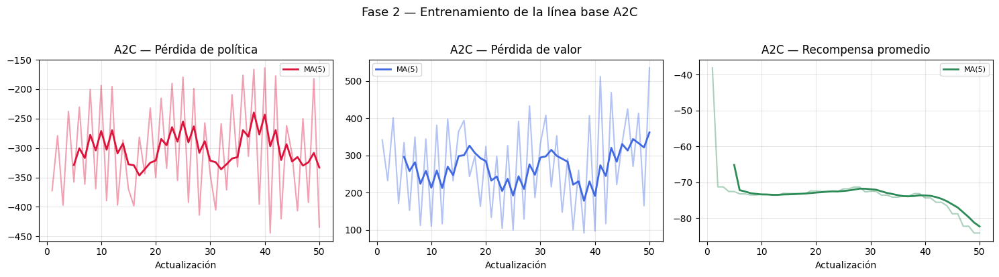

Recompensa promedio final de A2C : -84.1182
Entropía final                 : 21.1242


In [ ]:
# ============================================================
# Fase 2: Curvas de entrenamiento de A2C
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, (key, label, color) in zip(axes, [
    ('p_loss',     'Pérdida de política',  'crimson'),
    ('v_loss',     'Pérdida de valor',   'royalblue'),
    ('avg_reward', 'Recompensa promedio',   'seagreen'),
]):
    data = history_a2c[key]
    x = range(1, len(data)+1)
    ax.plot(x, data, alpha=0.4, color=color)
    if len(data) >= 5:
        smooth = np.convolve(data, np.ones(5)/5, 'valid')
        ax.plot(range(5, len(data)+1), smooth, color=color, lw=2, label='MA(5)')
    else:
        ax.plot(x, data, color=color, lw=2, label='sin suavizar')
    ax.set_title(f'A2C — {label}'); ax.set_xlabel('Actualización')
    ax.grid(alpha=0.3); ax.legend(fontsize=8)

plt.suptitle('Fase 2 — Entrenamiento de la línea base A2C', fontsize=13, y=1.02)
plt.tight_layout()
os.makedirs('results', exist_ok=True)
plt.savefig('results/phase2_a2c_curves.png', dpi=120, bbox_inches='tight')
plt.show()

print(f'Recompensa promedio final de A2C : {history_a2c["avg_reward"][-1]:.4f}')
print(f'Entropía final                 : {history_a2c["entropy"][-1]:.4f}')

---
## Fase 3 — PPO-GAE con mejoras

Mejoras incorporadas respecto de la línea base A2C:

| Mejora | Descripción | Problema que aborda |
|---|---|---|
| Objetivo PPO con clipping | `ε=0.2`, razón acotada en `[1-ε, 1+ε]` | Inestabilidad o colapso de política |
| GAE (`λ=0.95`) | Estimación ponderada de ventajas | Alta varianza en las ventajas |
| Normalización de recompensas | `RunningMeanStd` sobre el flujo de recompensas | Escalas inestables al inicio |
| Clipping de gradientes | `max_norm=0.5` | Explosión de gradientes |
| Decaimiento de entropía | Lineal de `0.01` a `0.001` | Control progresivo de la exploración |
| `K=4` épocas PPO | Reutilización del rollout | Mayor eficiencia muestral |
| Decaimiento del learning rate | De `3e-4` a `0` | Entrenamiento más estable |


In [ ]:
# ============================================================
# Fase 3: Entrenamiento de PPO-GAE
# ============================================================

torch.manual_seed(0)
np.random.seed(0)

N_UPDATES_PPO = 100   # aumentar a 500 para una corrida más completa
N_STEPS_PPO   = 64
N_ENVS_PPO    = 4

vec_env_ppo = make_vec_env(n_envs=N_ENVS_PPO, base_seed=0)
model_ppo   = SharedActorCritic()

trainer_ppo = PPOTrainer(
    env               = vec_env_ppo,
    model             = model_ppo,
    n_steps           = N_STEPS_PPO,
    n_updates         = N_UPDATES_PPO,
    gamma             = 0.99,
    gae_lambda        = 0.95,
    clip_epsilon      = 0.2,
    lr                = 3e-4,
    lr_decay          = True,
    c_v               = 0.5,
    c_e_start         = 0.01,
    c_e_end           = 0.001,
    n_epochs          = 4,
    batch_size        = 128,
    max_grad_norm     = 0.5,
    kl_target         = 0.02,
    normalize_rewards = True,
    log_dir           = 'results/ppo',
    save_dir          = 'checkpoints/ppo',
    save_freq         = 50,
)

history_ppo = trainer_ppo.train()
vec_env_ppo.close()

PPO actualización 20/100 | recompensa_promedio=-137.731
PPO actualización 40/100 | recompensa_promedio=-178.742
PPO actualización 60/100 | recompensa_promedio=-101.636
PPO actualización 80/100 | recompensa_promedio=-108.323
PPO actualización 100/100 | recompensa_promedio=-106.867


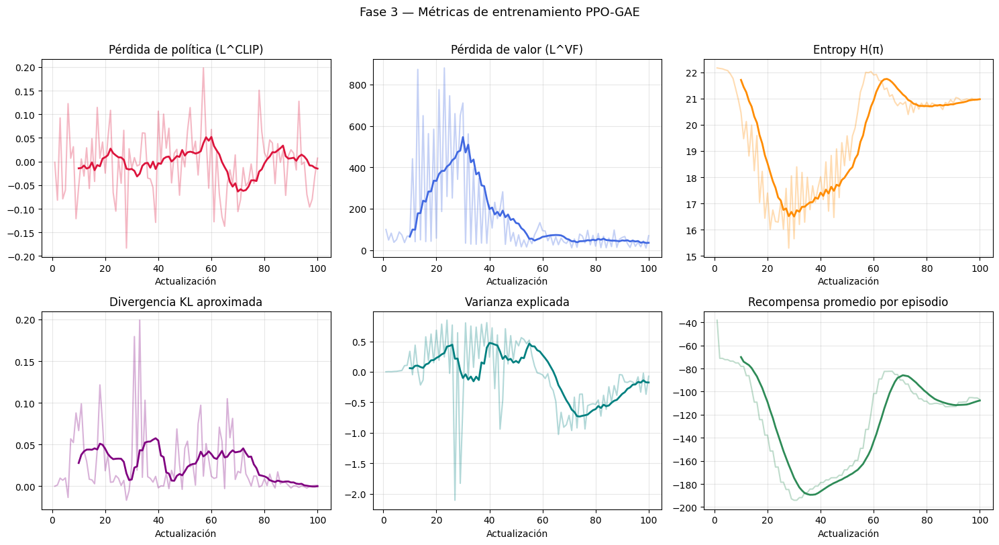

In [ ]:
# ============================================================
# Fase 3: Métricas detalladas de entrenamiento PPO-GAE
# ============================================================
metrics_to_plot = [
    ('p_loss',        'Pérdida de política (L^CLIP)',  'crimson'),
    ('v_loss',        'Pérdida de valor (L^VF)',     'royalblue'),
    ('entropy',       'Entropy H(π)',          'darkorange'),
    ('kl_div',        'Divergencia KL aproximada',        'purple'),
    ('explained_var', 'Varianza explicada',    'teal'),
    ('avg_reward',    'Recompensa promedio por episodio',    'seagreen'),
]

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for ax, (key, label, color) in zip(axes, metrics_to_plot):
    data = history_ppo.get(key, [])
    if not data:
        ax.set_visible(False)
        continue
    x = range(1, len(data)+1)
    ax.plot(x, data, alpha=0.3, color=color)
    w = min(max(5, len(data)//10), len(data))
    if len(data) >= 2:
        smooth = np.convolve(data, np.ones(w)/w, 'valid')
        ax.plot(range(w, len(data)+1), smooth, color=color, lw=2)
    else:
        ax.plot(x, data, color=color, lw=2)
    ax.set_title(label); ax.set_xlabel('Actualización')
    ax.grid(alpha=0.3)

plt.suptitle('Fase 3 — Métricas de entrenamiento PPO-GAE', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig('results/phase3_ppo_metrics.png', dpi=120, bbox_inches='tight')
plt.show()

---
## Fase 3 — Comparación A2C vs PPO

Se comparan las curvas principales de entrenamiento para observar si PPO-GAE mejora la estabilidad y el desempeño promedio respecto de la línea base A2C.


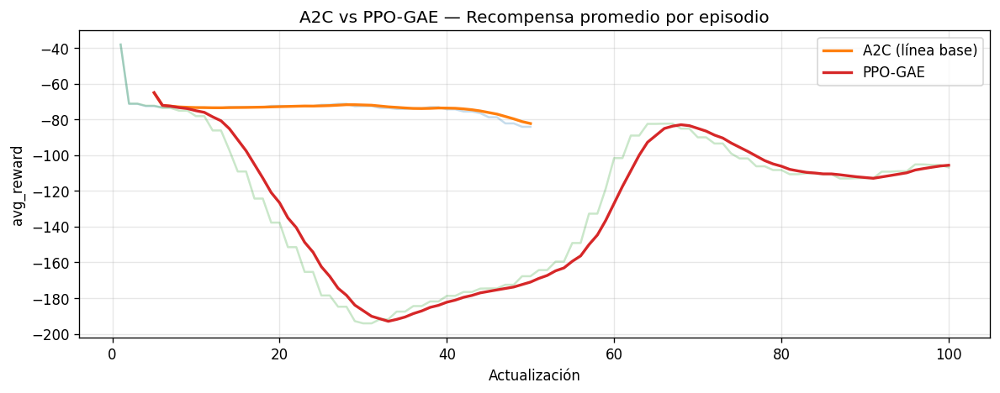

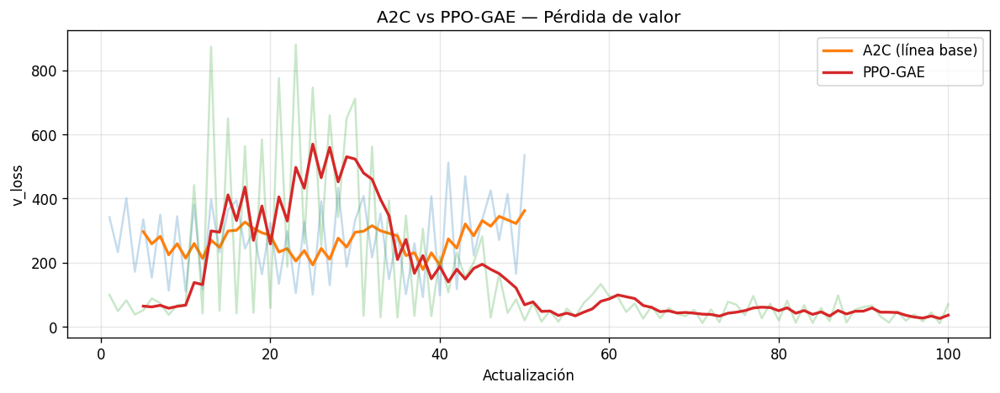

In [ ]:
# ============================================================
# A2C vs PPO — Comparación de convergencia de la recompensa
# ============================================================

MetricLogger.plot_comparison(
    histories  = {
        'A2C (línea base)': history_a2c,
        'PPO-GAE'        : history_ppo,
    },
    metric     = 'avg_reward',
    save_path  = 'results/a2c_vs_ppo_reward.png',
    smooth     = 5,
    title      = 'A2C vs PPO-GAE — Recompensa promedio por episodio',
)

MetricLogger.plot_comparison(
    histories  = {
        'A2C (línea base)': history_a2c,
        'PPO-GAE'        : history_ppo,
    },
    metric     = 'v_loss',
    save_path  = 'results/a2c_vs_ppo_vloss.png',
    smooth     = 5,
    title      = 'A2C vs PPO-GAE — Pérdida de valor',
)

from IPython.display import Image, display
display(Image('results/a2c_vs_ppo_reward.png'))
display(Image('results/a2c_vs_ppo_vloss.png'))


---
## Cómo aprenden los agentes: A2C vs PPO-GAE

Ambos métodos pertenecen a la familia **actor-crítico**. Esto significa que el modelo aprende dos cosas al mismo tiempo:

- **Actor:** decide qué acción tomar, es decir, qué fase de semáforo activar en cada intersección.
- **Crítico:** estima qué tan bueno es el estado actual, es decir, el valor esperado de estar en esa situación.

La diferencia principal está en la forma de actualizar la política.

### A2C

A2C actualiza la política usando la ventaja estimada entre lo que ocurrió y lo que el crítico esperaba. Es simple y eficiente, pero puede tener actualizaciones más bruscas. En problemas multi-intersección, eso puede generar oscilaciones: el agente mejora, luego cambia demasiado la política y puede degradar temporalmente el comportamiento.

### PPO-GAE

PPO usa una actualización más conservadora. El término de **clipping** evita que la nueva política se aleje demasiado de la anterior. Además, GAE suaviza la estimación de la ventaja combinando sesgo y varianza de manera más estable.

Por eso, en este tipo de problema, PPO-GAE suele ser una opción más robusta: aprende con más estabilidad y reduce la probabilidad de que una actualización destruya una política que ya venía funcionando razonablemente bien.


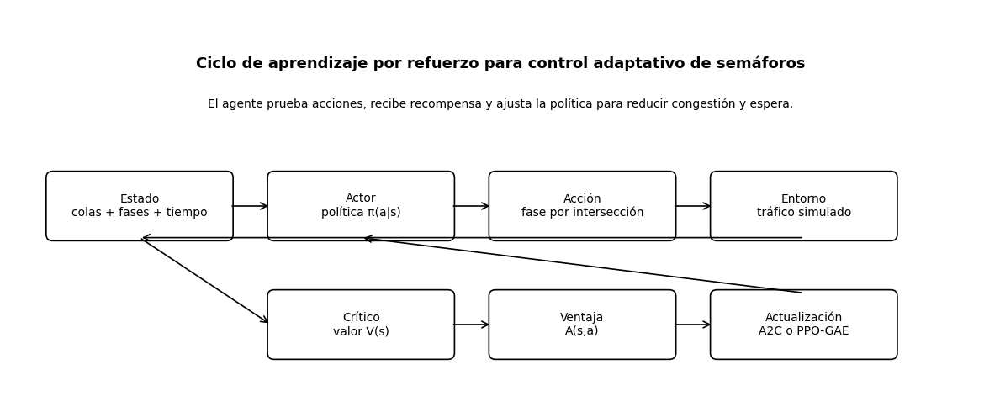

In [ ]:

# ============================================================
# Diagrama conceptual del aprendizaje actor-crítico
# ============================================================
# Esta figura resume el ciclo de aprendizaje usado por A2C y PPO.

import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch


def caja(ax, xy, texto, ancho=2.2, alto=0.8):
    x, y = xy
    patch = FancyBboxPatch(
        (x, y), ancho, alto,
        boxstyle='round,pad=0.04,rounding_size=0.08',
        linewidth=1.2,
        facecolor='white',
        edgecolor='black'
    )
    ax.add_patch(patch)
    ax.text(x + ancho/2, y + alto/2, texto, ha='center', va='center', fontsize=10)
    return patch


def flecha(ax, inicio, fin):
    ax.add_patch(FancyArrowPatch(inicio, fin, arrowstyle='->', mutation_scale=14, linewidth=1.2))

fig, ax = plt.subplots(figsize=(12, 5))
ax.axis('off')
ax.set_xlim(0, 12)
ax.set_ylim(0, 5)

caja(ax, (0.5, 2.1), 'Estado\ncolas + fases + tiempo')
caja(ax, (3.2, 2.1), 'Actor\npolítica π(a|s)')
caja(ax, (5.9, 2.1), 'Acción\nfase por intersección')
caja(ax, (8.6, 2.1), 'Entorno\ntráfico simulado')
caja(ax, (3.2, 0.6), 'Crítico\nvalor V(s)')
caja(ax, (5.9, 0.6), 'Ventaja\nA(s,a)')
caja(ax, (8.6, 0.6), 'Actualización\nA2C o PPO-GAE')

flecha(ax, (2.7, 2.5), (3.2, 2.5))
flecha(ax, (5.4, 2.5), (5.9, 2.5))
flecha(ax, (8.1, 2.5), (8.6, 2.5))
flecha(ax, (9.7, 2.1), (1.6, 2.1))
flecha(ax, (1.6, 2.1), (3.2, 1.0))
flecha(ax, (5.4, 1.0), (5.9, 1.0))
flecha(ax, (8.1, 1.0), (8.6, 1.0))
flecha(ax, (9.7, 1.4), (4.3, 2.1))

ax.text(6, 4.25, 'Ciclo de aprendizaje por refuerzo para control adaptativo de semáforos',
        ha='center', fontsize=13, weight='bold')
ax.text(6, 3.75, 'El agente prueba acciones, recibe recompensa y ajusta la política para reducir congestión y espera.',
        ha='center', fontsize=10)
plt.tight_layout()
plt.savefig('results/diagrama_actor_critico.png', dpi=140, bbox_inches='tight')
plt.show()


---
## Fase 4 — Evaluación y benchmarking

En esta sección se comparan varias políticas sobre el mismo entorno:
- política aleatoria;
- política de tiempo fijo;
- política actuada por colas;
- modelo A2C entrenado;
- modelo PPO-GAE entrenado.


In [ ]:
# ============================================================
# Fase 4: Comparación de todas las políticas (20 episodios cada una)
# ============================================================

N_EVAL = 20
eval_env = MultiIntersectionEnv(demand_factor=1.0)

print('Ejecutando políticas de evaluación...')
rand_r  = aggregate(random_policy(eval_env,    N_EVAL, seed_offset=500))
fixed_r = aggregate(fixed_time_policy(eval_env, N_EVAL, seed_offset=500))
act_r   = aggregate(actuated_policy(eval_env,  N_EVAL, seed_offset=500))
a2c_r   = aggregate(rl_policy(eval_env, model_a2c, N_EVAL, 500))
ppo_r   = aggregate(rl_policy(eval_env, model_ppo, N_EVAL, 500))
eval_env.close()

print('\n=== Comparación de políticas ===')
print(f'{"Política":<22} {"Recompensa":>12} {"Std":>8} {"Cola":>8} {"Espera":>8}')
print('-' * 62)
for name, r in [('Aleatoria',rand_r),('Tiempo fijo',fixed_r),
                ('Actuada',act_r),('A2C',a2c_r),('PPO-GAE',ppo_r)]:
    print(f'{name:<22} {r["mean_reward"]:>12.4f} {r["std_reward"]:>8.4f} '
          f'{r["mean_queue"]:>8.4f} {r["mean_waiting"]:>8.4f}')

Ejecutando políticas de evaluación...

=== Comparación de políticas ===
Política                 Recompensa      Std     Cola   Espera
--------------------------------------------------------------
Aleatoria                  -72.4513   4.0241   2.0651   2.9865
Tiempo fijo               -127.6995   3.4452   4.0443   5.5695
Actuada                    -30.1609   1.0810   0.6969   0.9849
A2C                       -621.6429  12.9472  16.0291  55.1147
PPO-GAE                   -628.1159  15.3104  16.1673  55.8984


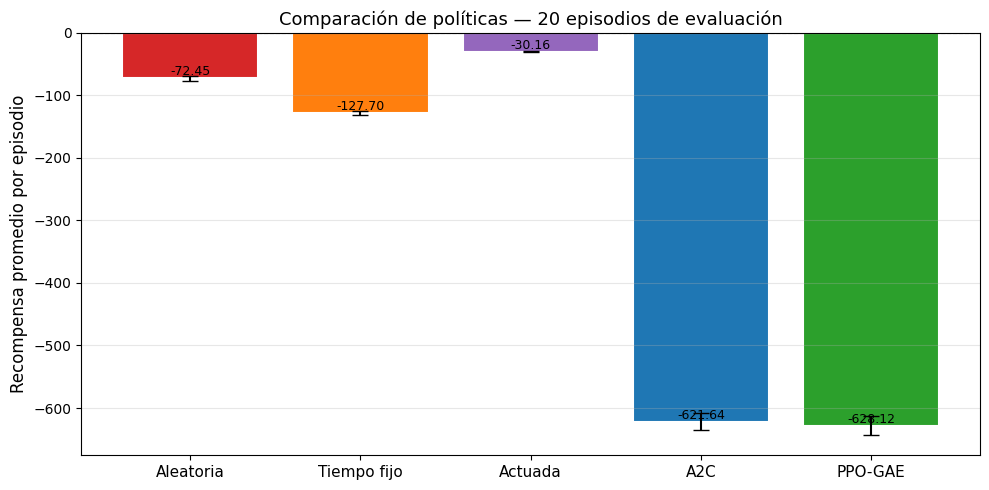

In [ ]:
# ============================================================
# Fase 4: Gráfico de barras comparativo
# ============================================================
policies = ['Aleatoria', 'Tiempo fijo', 'Actuada', 'A2C', 'PPO-GAE']
rewards  = [rand_r['mean_reward'], fixed_r['mean_reward'],
            act_r['mean_reward'],  a2c_r['mean_reward'],  ppo_r['mean_reward']]
stds     = [rand_r['std_reward'],  fixed_r['std_reward'],
            act_r['std_reward'],   a2c_r['std_reward'],   ppo_r['std_reward']]
colors   = ['#d62728','#ff7f0e','#9467bd','#1f77b4','#2ca02c']

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(policies, rewards, color=colors, edgecolor='white',
              linewidth=1.5, yerr=stds, capsize=6)
ax.set_ylabel('Recompensa promedio por episodio', fontsize=12)
ax.set_title('Comparación de políticas — 20 episodios de evaluación', fontsize=13)
ax.grid(axis='y', alpha=0.3)
ax.axhline(0, color='gray', lw=0.8, ls='--')
for bar, r in zip(bars, rewards):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
            f'{r:.2f}', ha='center', va='bottom', fontsize=9)
plt.xticks(fontsize=11)
plt.tight_layout()
plt.savefig('results/phase4_policy_comparison.png', dpi=120)
plt.show()

In [ ]:
# ============================================================
# Fase 4: Evaluación PPO multi-semilla (5 semillas)
# ============================================================
N_SEEDS = 5
seed_rewards = []

for s in range(N_SEEDS):
    senv = MultiIntersectionEnv(seed=s)
    res  = rl_policy(senv, model_ppo, 10, seed_offset=s*100)
    senv.close()
    ep_rs = [r['reward'] for r in res]
    seed_rewards.append(ep_rs)
    print(f'  Semilla {s}: media={np.mean(ep_rs):.3f} ± {np.std(ep_rs):.3f}')

all_rewards = np.array(seed_rewards)
print(f'\nPPO multi-semilla: {all_rewards.mean():.3f} ± {all_rewards.std():.3f}')

MetricLogger.plot_multi_seed(
    seed_histories = [{'avg_reward': r} for r in seed_rewards],
    metric         = 'avg_reward',
    save_path      = 'results/phase4_multiseed.png',
    label          = 'PPO-GAE',
    smooth         = 2,
)

  Semilla 0: media=-623.221 ± 17.824
  Semilla 1: media=-633.541 ± 19.199
  Semilla 2: media=-621.629 ± 14.586
  Semilla 3: media=-623.666 ± 12.896
  Semilla 4: media=-608.023 ± 16.929

PPO multi-semilla: -622.016 ± 18.357



---
## Animaciones después del entrenamiento

Esta sección permite observar el comportamiento de distintas políticas sobre el mismo entorno.

La comparación visual es importante porque las métricas agregadas pueden ocultar fenómenos dinámicos. Por ejemplo, dos políticas pueden tener recompensa parecida, pero una puede generar colas más inestables o cambios de fase más bruscos.

Se comparan tres escenarios:

1. **Antes del entrenamiento:** política aleatoria.
2. **Después de entrenar A2C:** política aprendida por la línea base actor-crítico.
3. **Después de entrenar PPO-GAE:** política aprendida con actualización conservadora y ventaja generalizada.

En la animación se muestran:

- luces verdes y rojas;
- colas relativas por dirección;
- recompensa acumulada;
- cola media;
- espera media;
- porcentaje de intersecciones que cambiaron de fase.


In [ ]:

# ============================================================
# Animaciones comparativas: antes y después del entrenamiento
# ============================================================
# Las animaciones se generan con matplotlib y se muestran como HTML,
# por lo que funcionan directamente en Google Colab sin dependencias externas.

from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
from matplotlib.patches import Rectangle, Circle
import numpy as np
import torch


def accion_aleatoria(env, obs=None, model=None, paso=0):
    return env.action_space.sample()


def accion_tiempo_fijo(env, obs=None, model=None, paso=0, periodo=10):
    return np.full(env.n_intersections, (paso // periodo) % 4, dtype=np.int64)


def accion_actuada(env, obs=None, model=None, paso=0):
    estado = obs.reshape(env.n_intersections, 9)
    return np.argmax(estado[:, :4], axis=1).astype(np.int64)


def accion_modelo_rl(env, obs=None, model=None, paso=0):
    model.eval()
    with torch.no_grad():
        logits, _ = model(torch.tensor(obs[None, :], dtype=torch.float32, device=DEVICE))
        accion = torch.argmax(logits, dim=-1).squeeze(0).cpu().numpy()
    return accion.astype(np.int64)


def _dibujar_estado_en_axis(ax, env, titulo, recompensa_acum=0.0, info=None):
    """Dibuja el estado actual del entorno en un eje existente."""
    grid = env.grid_size
    ax.clear()
    ax.set_aspect('equal')
    ax.set_xlim(-0.95, grid - 0.05)
    ax.set_ylim(-1.05, grid - 0.05)
    ax.axis('off')

    subtitulo = f'{titulo}\nPaso {env.t} | Recompensa acum.: {recompensa_acum:.2f}'
    if info is not None:
        subtitulo += f' | Cola: {info["mean_queue"]:.2f} | Espera: {info["mean_waiting"]:.2f} | Cambios: {info["switches"]:.2f}'
    ax.set_title(subtitulo, fontsize=10)

    for i in range(grid):
        ax.add_patch(Rectangle((-0.85, i - 0.08), grid - 0.1, 0.16, alpha=0.10))
        ax.add_patch(Rectangle((i - 0.08, -0.85), 0.16, grid - 0.1, alpha=0.10))

    for idx in range(env.n_intersections):
        row = idx // grid
        col = idx % grid
        x, y = col, grid - 1 - row
        fase = int(env.phases[idx])
        colas = env.queues[idx]

        ax.add_patch(Rectangle((x - 0.13, y - 0.13), 0.26, 0.26, alpha=0.20))
        ax.text(x, y - 0.34, f'I{idx}', ha='center', va='center', fontsize=7)

        posiciones_luces = {
            0: (x, y + 0.23),
            1: (x + 0.23, y),
            2: (x, y - 0.23),
            3: (x - 0.23, y),
        }
        for d, (lx, ly) in posiciones_luces.items():
            color = 'green' if d == fase else 'red'
            ax.add_patch(Circle((lx, ly), 0.045, color=color, alpha=0.85))

        escala = 0.45
        qn, qe, qs, qo = [float(np.clip(v / 25.0, 0.0, 1.0)) * escala for v in colas]
        ax.add_patch(Rectangle((x - 0.035, y + 0.31), 0.07, qn, alpha=0.65))
        ax.add_patch(Rectangle((x + 0.31, y - 0.035), qe, 0.07, alpha=0.65))
        ax.add_patch(Rectangle((x - 0.035, y - 0.31 - qs), 0.07, qs, alpha=0.65))
        ax.add_patch(Rectangle((x - 0.31 - qo, y - 0.035), qo, 0.07, alpha=0.65))

    ax.text(-0.88, -0.82, 'Verde: fase activa | Rojo: fase detenida | Barras: cola relativa', fontsize=8)


def animar_politica(nombre, funcion_accion, model=None, seed=123, pasos=45, intervalo_ms=350, demand_factor=1.0):
    """Anima una política sobre el entorno de semáforos."""
    env = MultiIntersectionEnv(demand_factor=demand_factor, seed=seed, max_steps=pasos)
    obs, _ = env.reset(seed=seed)
    recompensa_acum = 0.0
    info_actual = {'mean_queue': float(env.queues.mean()), 'mean_waiting': float(env.waiting.mean()), 'switches': 0.0}

    fig, ax = plt.subplots(figsize=(7, 7))

    def update(frame):
        nonlocal obs, recompensa_acum, info_actual
        accion = funcion_accion(env, obs=obs, model=model, paso=frame)
        obs, reward, term, trunc, info_actual = env.step(accion)
        recompensa_acum += reward
        _dibujar_estado_en_axis(ax, env, nombre, recompensa_acum, info_actual)
        return []

    anim = FuncAnimation(fig, update, frames=pasos, interval=intervalo_ms, blit=False)
    plt.close(fig)
    return HTML(anim.to_jshtml())

# Animación de referencia: comportamiento antes del entrenamiento.
display(animar_politica('Antes del entrenamiento — política aleatoria', accion_aleatoria, seed=21, pasos=35))


In [ ]:

# ============================================================
# Animaciones de los agentes entrenados: A2C y PPO-GAE
# ============================================================
# Estas celdas deben ejecutarse después del entrenamiento de A2C y PPO.
# Permiten observar si el agente aprendido reduce colas y espera frente a la política aleatoria.

print('Animación del agente A2C entrenado')
display(animar_politica('Después del entrenamiento — A2C', accion_modelo_rl, model=model_a2c, seed=21, pasos=35))

print('Animación del agente PPO-GAE entrenado')
display(animar_politica('Después del entrenamiento — PPO-GAE', accion_modelo_rl, model=model_ppo, seed=21, pasos=35))


Animación del agente A2C entrenado


Animación del agente PPO-GAE entrenado



---
## Comparación dinámica en un mismo episodio

Además de mirar la animación, conviene comparar la evolución paso a paso de las métricas.

Las tres curvas más útiles son:

- **cola media:** mide congestión instantánea;
- **espera media:** aproxima acumulación de demora;
- **recompensa acumulada:** resume el desempeño global de la política.

Para una presentación académica, esta sección sirve para conectar la evidencia visual con evidencia cuantitativa.


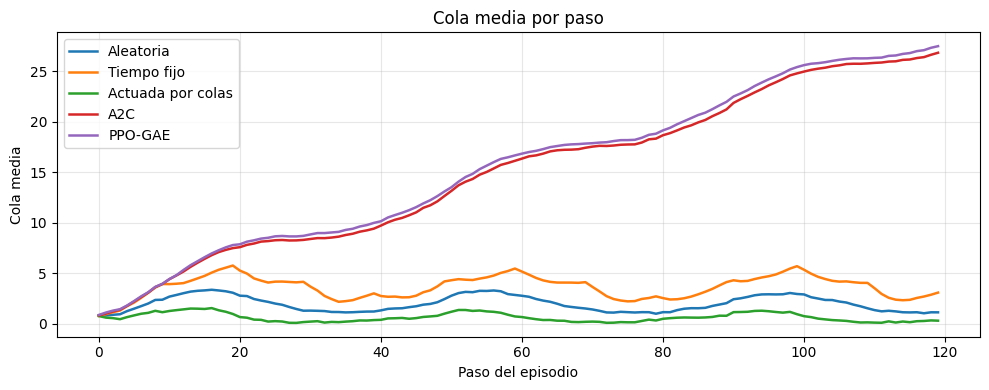

Guardado: results/comparacion_dinamica_cola.png


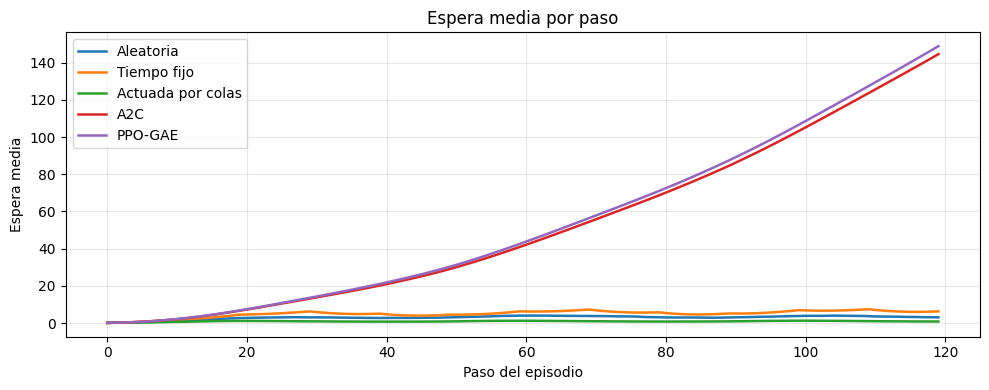

Guardado: results/comparacion_dinamica_espera.png


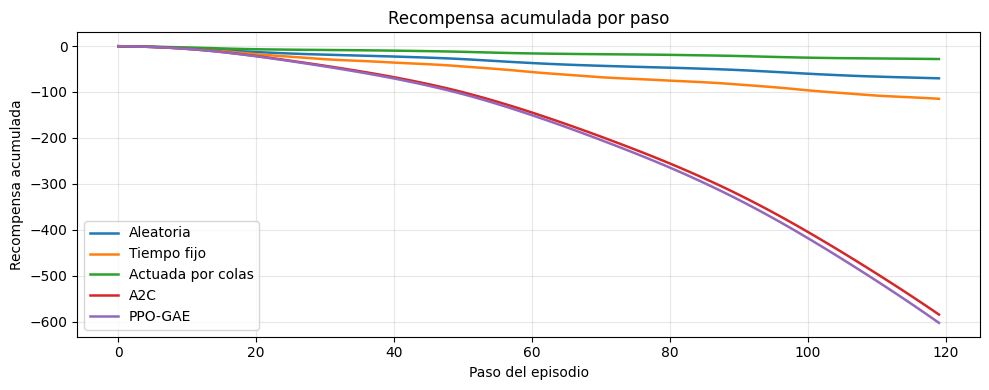

Guardado: results/comparacion_dinamica_reward_acum.png


In [ ]:

# ============================================================
# Comparación paso a paso: aleatoria vs actuada vs A2C vs PPO-GAE
# ============================================================

def ejecutar_trayectoria(nombre, funcion_accion, model=None, seed=777, pasos=120, demand_factor=1.0):
    env = MultiIntersectionEnv(demand_factor=demand_factor, seed=seed, max_steps=pasos)
    obs, _ = env.reset(seed=seed)
    datos = {'politica': nombre, 'reward': [], 'reward_acum': [], 'cola': [], 'espera': [], 'cambios': []}
    reward_acum = 0.0
    done = False
    paso = 0
    while not done:
        accion = funcion_accion(env, obs=obs, model=model, paso=paso)
        obs, reward, term, trunc, info = env.step(accion)
        reward_acum += reward
        datos['reward'].append(reward)
        datos['reward_acum'].append(reward_acum)
        datos['cola'].append(info['mean_queue'])
        datos['espera'].append(info['mean_waiting'])
        datos['cambios'].append(info['switches'])
        done = term or trunc
        paso += 1
    return datos

trayectorias = [
    ejecutar_trayectoria('Aleatoria', accion_aleatoria, seed=777),
    ejecutar_trayectoria('Tiempo fijo', accion_tiempo_fijo, seed=777),
    ejecutar_trayectoria('Actuada por colas', accion_actuada, seed=777),
    ejecutar_trayectoria('A2C', accion_modelo_rl, model=model_a2c, seed=777),
    ejecutar_trayectoria('PPO-GAE', accion_modelo_rl, model=model_ppo, seed=777),
]

for metrica, titulo, ylabel in [
    ('cola', 'Cola media por paso', 'Cola media'),
    ('espera', 'Espera media por paso', 'Espera media'),
    ('reward_acum', 'Recompensa acumulada por paso', 'Recompensa acumulada')
]:
    plt.figure(figsize=(10, 4))
    for datos in trayectorias:
        plt.plot(datos[metrica], label=datos['politica'], linewidth=1.8)
    plt.title(titulo)
    plt.xlabel('Paso del episodio')
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    nombre_archivo = f"results/comparacion_dinamica_{metrica}.png"
    plt.savefig(nombre_archivo, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'Guardado: {nombre_archivo}')



---
## Interpretación de la política aprendida

Para que el trabajo no quede como una caja negra, se agrega una lectura simple de las decisiones del agente.

La siguiente celda compara, para un mismo estado:

- cuál es la dirección con mayor cola en cada intersección;
- qué fase elige A2C;
- qué fase elige PPO-GAE.

Esto permite ver si el agente aprendió una regla parecida a “dar verde a la dirección más congestionada” o si toma decisiones diferentes porque está considerando efectos futuros, cambios de fase y coordinación global.


Interpretación de un estado de ejemplo
Valor estimado por A2C     : -6.4818
Valor estimado por PPO-GAE : 10.7009

Intersección  Mayor cola   A2C elige    PPO elige   
----------------------------------------------------
I0            E            O            O           
I1            N            E            O           
I2            S            S            O           
I3            E            N            E           
I4            O            N            O           
I5            N            N            E           
I6            E            S            S           
I7            E            S            S           
I8            S            E            E           
I9            E            N            N           
I10           N            S            E           
I11           O            O            E           
I12           E            E            O           
I13           E            E            N           
I14           N            E          

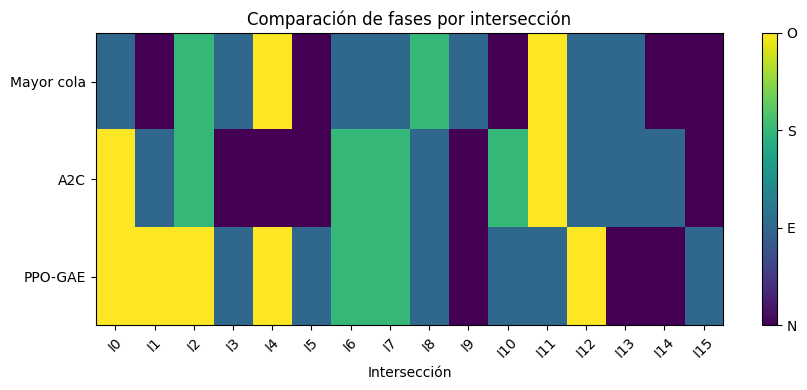

In [ ]:

# ============================================================
# Interpretación de decisiones: cola máxima vs acción elegida
# ============================================================

DIRECCION_CORTA = np.array(['N', 'E', 'S', 'O'])

def acciones_modelo_para_estado(model, obs):
    model.eval()
    with torch.no_grad():
        logits, value = model(torch.tensor(obs[None, :], dtype=torch.float32, device=DEVICE))
        accion = torch.argmax(logits, dim=-1).squeeze(0).cpu().numpy()
    return accion, float(value.item())

env_interpretacion = MultiIntersectionEnv(demand_factor=1.0, seed=2026)
obs, _ = env_interpretacion.reset(seed=2026)

# Avanzamos algunos pasos con una política actuada para generar un estado con colas más interesantes.
for paso in range(20):
    accion = accion_actuada(env_interpretacion, obs=obs, paso=paso)
    obs, _, _, _, _ = env_interpretacion.step(accion)

estado = obs.reshape(env_interpretacion.n_intersections, 9)
cola_max = np.argmax(estado[:, :4], axis=1)
accion_a2c, valor_a2c = acciones_modelo_para_estado(model_a2c, obs)
accion_ppo, valor_ppo = acciones_modelo_para_estado(model_ppo, obs)

print('Interpretación de un estado de ejemplo')
print(f'Valor estimado por A2C     : {valor_a2c:.4f}')
print(f'Valor estimado por PPO-GAE : {valor_ppo:.4f}')
print()
print(f'{"Intersección":<13} {"Mayor cola":<12} {"A2C elige":<12} {"PPO elige":<12}')
print('-' * 52)
for i in range(env_interpretacion.n_intersections):
    print(f'I{i:<12} {DIRECCION_CORTA[cola_max[i]]:<12} {DIRECCION_CORTA[accion_a2c[i]]:<12} {DIRECCION_CORTA[accion_ppo[i]]:<12}')

# Resumen visual por intersección.
fig, ax = plt.subplots(figsize=(9, 4))
mat = np.vstack([cola_max, accion_a2c, accion_ppo])
im = ax.imshow(mat, aspect='auto', vmin=0, vmax=3)
ax.set_title('Comparación de fases por intersección')
ax.set_xlabel('Intersección')
ax.set_yticks([0, 1, 2])
ax.set_yticklabels(['Mayor cola', 'A2C', 'PPO-GAE'])
ax.set_xticks(range(env_interpretacion.n_intersections))
ax.set_xticklabels([f'I{i}' for i in range(env_interpretacion.n_intersections)], rotation=45)
cbar = plt.colorbar(im, ax=ax, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(['N', 'E', 'S', 'O'])
plt.tight_layout()
plt.savefig('results/interpretacion_politica.png', dpi=130, bbox_inches='tight')
plt.show()


---
## Fase 5 — Curriculum learning, checkpoints y exportación

Esta fase muestra una estrategia simple de curriculum learning, donde la demanda del entorno aumenta progresivamente a medida que el agente mejora o se cumple un presupuesto de actualizaciones. También se exporta una parte del modelo en formato TorchScript para facilitar un escenario de despliegue.


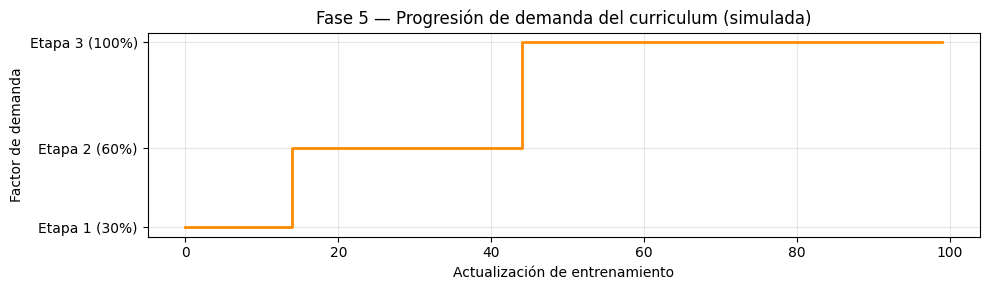

Estado del scheduler de curriculum: CurriculumScheduler(stage=2, demand=1.0)


In [ ]:
# ============================================================
# Fase 5: Demostración de curriculum learning
# ============================================================

curriculum = CurriculumScheduler(
    stage_demands    = [0.3, 0.6, 1.0],
    stage_thresholds = [-5.5, -3.5],
    update_budgets   = [30, 30, 40],
)

# Simulación de la progresión del curriculum
demand_log = []
for step in range(100):
    demand = curriculum.get_demand_factor()
    demand_log.append(demand)
    # Simulación de una recompensa que mejora progresivamente
    sim_reward = -6.0 + step * 0.04
    curriculum.step(sim_reward)

plt.figure(figsize=(10, 3))
plt.step(range(100), demand_log, where='post', color='darkorange', lw=2)
plt.yticks([0.3, 0.6, 1.0], ['Etapa 1 (30%)', 'Etapa 2 (60%)', 'Etapa 3 (100%)'])
plt.xlabel('Actualización de entrenamiento'); plt.ylabel('Factor de demanda')
plt.title('Fase 5 — Progresión de demanda del curriculum (simulada)')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('results/phase5_curriculum.png', dpi=120)
plt.show()
print('Estado del scheduler de curriculum:', curriculum)

In [ ]:
# ============================================================
# Fase 5: Exportación TorchScript para despliegue
# ============================================================
import torch
import os

os.makedirs('checkpoints/ppo', exist_ok=True)

class ValueFunctionWrapper(torch.nn.Module):
    def __init__(self, actor_critic_model):
        super().__init__()
        self.actor_critic_model = actor_critic_model
    def forward(self, obs):
        return self.actor_critic_model.get_value(obs)

# Exportación de la función de valor como traza TorchScript
model_ppo.eval()
example_obs = torch.zeros(1, 144, device=DEVICE)
value_wrapper = ValueFunctionWrapper(model_ppo).to(DEVICE)
traced_value = torch.jit.trace(value_wrapper, example_obs)
traced_value.save('checkpoints/ppo/value_fn_scripted.pt')

# Verificación de carga y ejecución
loaded = torch.jit.load('checkpoints/ppo/value_fn_scripted.pt', map_location=DEVICE)
test_out = loaded(example_obs)
print(f'Forma de salida de la función de valor TorchScript: {test_out.shape}  (esperado: [1, 1])')
print('Exportación TorchScript: OK')
model_ppo.train()


Forma de salida de la función de valor TorchScript: torch.Size([1, 1])  (esperado: [1, 1])
Exportación TorchScript: OK


SharedActorCritic(
  (trunk): Sequential(
    (0): Linear(in_features=144, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=256, bias=True)
    (3): ReLU()
  )
  (actor): Linear(in_features=256, out_features=64, bias=True)
  (critic): Sequential(
    (0): Linear(in_features=256, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [ ]:
# ============================================================
# Fase 5: Instrucciones para iniciar TensorBoard
# ============================================================
print('Los logs de TensorBoard se guardan en:')
print('  results/a2c/  -- A2C metrics')
print('  results/ppo/  -- PPO metrics')
print()
print('Para iniciar TensorBoard, ejecutá:')
print('  tensorboard --logdir results')
print()
print('Métricas disponibles:')
print('  A2C/P_Loss, A2C/V_Loss, A2C/Entropy, A2C/Avg_Reward, A2C/Avg_Len')
print('  PPO/p_loss, PPO/v_loss, PPO/entropy, PPO/kl_div, PPO/grad_norm,')
print('  PPO/explained_var, PPO/Avg_Reward, PPO/Entropy_Coeff, PPO/LR')

Los logs de TensorBoard se guardan en:
  results/a2c/  -- A2C metrics
  results/ppo/  -- PPO metrics

Para iniciar TensorBoard, ejecutá:
  tensorboard --logdir results

Métricas disponibles:
  A2C/P_Loss, A2C/V_Loss, A2C/Entropy, A2C/Avg_Reward, A2C/Avg_Len
  PPO/p_loss, PPO/v_loss, PPO/entropy, PPO/kl_div, PPO/grad_norm,
  PPO/explained_var, PPO/Avg_Reward, PPO/Entropy_Coeff, PPO/LR



---
## Conclusiones

A partir de las métricas y visualizaciones, el trabajo permite concluir las siguientes ideas:

1. El problema de control de semáforos puede formularse naturalmente como un problema de **Reinforcement Learning**, porque existe un agente que toma decisiones secuenciales y recibe recompensas según el impacto de esas decisiones.

2. El estado observado por el agente resume la congestión, la fase activa y el tiempo de simulación. Esto evita depender de imágenes o sensores complejos y permite trabajar con una representación vectorial simple.

3. La política aleatoria sirve como línea base mínima: muestra qué ocurre cuando no hay aprendizaje ni estrategia de control.

4. A2C introduce aprendizaje actor-crítico y puede mejorar respecto de una política aleatoria, pero sus actualizaciones pueden ser más inestables.

5. PPO-GAE mejora la estabilidad mediante clipping y estimación suavizada de la ventaja. Por eso suele ser más adecuado para problemas donde una mala actualización puede degradar una política ya aprendida.

6. Las animaciones antes/después son importantes porque permiten observar comportamiento emergente: coordinación de fases, reducción de colas y evolución más ordenada del tránsito.

7. La comparación cuantitativa y visual evita que el análisis dependa de una única métrica. El desempeño se analiza desde recompensa, cola media, espera media, estabilidad y comportamiento dinámico.

En síntesis, el notebook no solamente entrena dos agentes, sino que muestra de manera reproducible y explicable cómo un sistema de aprendizaje por refuerzo puede aplicarse al control adaptativo de semáforos.



---
## Resumen técnico final

### Visualización incorporada

El notebook incluye una sección visual del modelo de semáforos que muestra la grilla 4×4, las fases activas, las colas por dirección y animaciones compatibles con Colab.

### Estado, acción y recompensa

- **Estado:** vector de 144 dimensiones = 16 intersecciones × 9 características.
- **Acción:** vector de 16 decisiones discretas, una fase por intersección.
- **Recompensa:** penaliza congestión, espera acumulada y cambios excesivos de fase.

### Arquitectura del modelo

```text
Tronco compartido: Linear(144,256)+ReLU -> Linear(256,256)+ReLU
  ├── Actor: Linear(256, 16×4), reinterpretado como 16 cabezales de 4 acciones
  └── Crítico: Linear(256,128)+ReLU -> Linear(128,1)
```

### Función de pérdida PPO-GAE

La pérdida total combina tres objetivos:

```text
pérdida_total = pérdida_política + c_v * pérdida_valor - c_e * entropía
```

Donde:

- la pérdida de política usa el objetivo clipped de PPO;
- la pérdida de valor entrena al crítico para estimar retornos;
- la entropía incentiva exploración;
- GAE estima ventajas más estables para reducir varianza.

### Lectura esperada de resultados

| Aspecto | A2C | PPO-GAE |
|--------|-----|---------|
| Tipo de método | Actor-crítico simple | Actor-crítico con actualización conservadora |
| Ventaja | Retornos n-step | GAE |
| Estabilidad | Media | Alta |
| Riesgo de actualización brusca | Mayor | Menor por clipping |
| Interpretación esperada | Mejora frente a aleatorio | Mejor estabilidad y desempeño promedio |

### Artefactos generados

El notebook genera gráficos, animaciones renderizadas en HTML dentro de Colab, checkpoints del modelo y exportación TorchScript de la función de valor.


In [ ]:
# ============================================================
# Final: Listado de artefactos generados
# ============================================================
import os

print('Archivos generados:')
for root, dirs, files in os.walk('results'):
    for f in sorted(files):
        path = os.path.join(root, f)
        size = os.path.getsize(path)
        print(f'  {path}  ({size:,} bytes)')

print()
print('Checkpoints:')
for root, dirs, files in os.walk('checkpoints'):
    for f in sorted(files):
        path = os.path.join(root, f)
        size = os.path.getsize(path)
        print(f'  {path}  ({size:,} bytes)')

Archivos generados:
  results/a2c_vs_ppo_reward.png  (68,470 bytes)
  results/a2c_vs_ppo_vloss.png  (109,377 bytes)
  results/comparacion_dinamica_cola.png  (82,656 bytes)
  results/comparacion_dinamica_espera.png  (67,259 bytes)
  results/comparacion_dinamica_reward_acum.png  (80,135 bytes)
  results/diagrama_actor_critico.png  (73,838 bytes)
  results/interpretacion_politica.png  (29,133 bytes)
  results/phase1_queue_random.png  (46,273 bytes)
  results/phase2_a2c_curves.png  (158,757 bytes)
  results/phase3_ppo_metrics.png  (285,221 bytes)
  results/phase4_multiseed.png  (111,854 bytes)
  results/phase4_policy_comparison.png  (46,411 bytes)
  results/phase5_curriculum.png  (32,804 bytes)

Checkpoints:
  checkpoints/ppo/model.pt  (613,157 bytes)
  checkpoints/ppo/model_100.pt  (613,797 bytes)
  checkpoints/ppo/model_50.pt  (613,781 bytes)
  checkpoints/ppo/value_fn_scripted.pt  (631,445 bytes)
  checkpoints/a2c/model.pt  (613,157 bytes)
